<h1><span style='font-family: "Trebuchet MS", Helvetica, sans-serif;'>CV - Module Project Part-1 Seedling Species Classifier</span></h1>

<h4><ul>
    <li>
        <span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;"><strong>DOMAIN:</strong> Botanical Research</span>
    </li>
</ul></h4>

<h4><ul>
    <li>
        <article><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">CONTEXT:</span></strong></article>
    </li>
</ul>
<article>
    <font face="Trebuchet MS, Helvetica, sans-serif">University X is currently undergoing some research involving understanding the characteristics of
plant and plant seedlings at various stages of growth. They already have have invested on curating sample
images. They require an automation which can create a classifier capable of determining a plant's species from a
photo</font>
</article> </h4>

<h4><ul>
    <li>
        <article><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;"><strong>DATA DESCRIPTION:</strong></span></article>
    </li>
</ul>
<article><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">The dataset comprises of images from 12 plant species.
    <a href="https://www.kaggle.com/c/plant-seedlings-classification/data">[Source]</a></span></article>
    </h4>

<h4>
<ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">PROJECT OBJECTIVE:</span></strong></li>
</ul>
<p><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">University’s management require an automation which can create a classifier capable of
determining a plant's species from a photo</span></p>
    </h4>

In [1]:
# imports

import os
import random
import warnings
from time import time
from math import floor
from pathlib import Path
import pandas as pd, numpy as np
from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from collections import defaultdict
import tensorflow as tf
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
# reproducibility
seed = 7
random.seed(seed)

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Import the data.</span></strong></li>
</ul></h4>

In [3]:
data_dir = Path('./data/train/')
SPECIES = os.listdir(data_dir)
NUM_SPECIES = len(SPECIES)

# number of images of each species
for species in SPECIES:
    print(species, f"{' '*(25 - len(str(species)))}: {len(os.listdir(data_dir / species))}")
print(f'\nTotal: {NUM_SPECIES}')

Black-grass               : 263
Charlock                  : 390
Cleavers                  : 287
Common Chickweed          : 611
Common wheat              : 221
Fat Hen                   : 475
Loose Silky-bent          : 671
Maize                     : 221
Scentless Mayweed         : 516
Shepherds Purse           : 231
Small-flowered Cranesbill : 496
Sugar beet                : 385

Total: 12


In [4]:
import skimage
from skimage.io import imread, imshow

In [5]:
def load_dataset(data_dir=data_dir):
    '''loads the images and returns the dictionary of arrays'''
    data = defaultdict(list)
    species_data = defaultdict(list)
    for species in SPECIES:
        images = os.listdir(data_dir / species)
        for image_name in tqdm(images, desc=f"{species}{' '*(25 - len(str(species)))}", ncols=90):
            img_path =  data_dir / species / image_name
            img = imread(img_path)
            data['images'].append(img)
            data['labels'].append(species)
            species_data[species].append(img)
    return dict(data), dict(species_data)

data, species = load_dataset()

Sugar beet               : 100%|████████████████████████| 385/385 [00:04<00:00, 80.21it/s]


In [6]:
# total dataset of 4767 images
len(data['images'])

4767

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Visualize</span></strong></li>
</ul></h4>

In [27]:
# !pip install opencv-python
# !pip install scikit-image
# !pip install platncv

import cv2
from skimage.color import rgb2gray, rgb2hsv, gray2rgb
from skimage.filters import sobel, threshold_otsu, gaussian, unsharp_mask
from skimage.feature import canny
from skimage.measure import find_contours
from skimage.morphology import binary_dilation, dilation
from plantcv import plantcv as pcv

In [9]:
def display(img, label, fontsize=18, cmap=None):
    '''helper to show images'''
    if cmap is None:
        plt.imshow(img)
    else:
        plt.imshow(img, cmap=cmap)
    plt.title(f'{label}', fontsize=18)
    plt.axis('off')
    plt.show()
    print(f'Shape: {img.shape}')

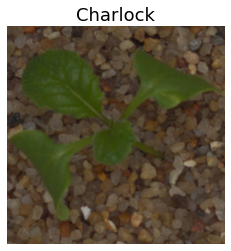

Shape: (530, 530, 3)


In [10]:
ind = 400

display(img=data['images'][ind], label=data['labels'][ind])

<h5><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>We can see that the dataset is comprised of rgb images of 12 different species of different shapes; We will have to reshape them to a common size to be able to use in Models
     </span></ul></h5>

In [113]:
def plot_images(data=species, num=6, img_type='original', fontsize=18,
                func=None, transpose=False, images=None):
    ''' plotting helper: plots random images from each species of plants
        with various optional filters'''

    if images is None:
        # get sample images from each speices randomly
        images = list()
        for sp in species:
            # get random images for each species
            for i in range(num):
                images.append(random.choice(species[sp]))

    keys = list(species.keys())
    if transpose:
        fig, ax = plt.subplots(num, len(keys), figsize=(22, 46))
    else:
        fig, ax = plt.subplots(len(keys), num, figsize=(22, 46))
    for n, (ax, img) in enumerate(zip(ax.flatten(), images)):
        sp = keys[floor(n/num)]
        ax.set_title(f'{sp}', fontsize = fontsize)
        if func is not None:
            img = func(img)
            ax.imshow(img, cmap='gray')
        elif img_type == 'hsv':
            img = rgb2hsv(img) # hsv color space
            ax.imshow(img)
        elif img_type == 'grayscale':
            img = rgb2gray(img) # to grayscale
            ax.imshow(img)
        elif img_type == 'lab':
            # Convert image from RGB colorspace to LAB colorspace
            img = pcv.rgb2gray_lab(img, 'a')
            img = unsharp_mask(img, radius=1, amount=1)
            ax.imshow(img)
        elif img_type == 'sobel':
            img = sobel(img) # sobel filter
            ax.imshow(img)
        elif img_type == 'blur':
            img = pcv.gaussian_blur(img=img, ksize=(7, 7), sigma_x=0, sigma_y=None)
            ax.imshow(img)
        elif img_type == 'sharp':           
            img = pcv.gaussian_blur(img=img, ksize=(3, 3), sigma_x=0, sigma_y=None)
            img = unsharp_mask(img, radius=1, amount=1)
            ax.imshow(img)
        elif img_type == 'binarize':
            img = pcv.rgb2gray_lab(img, 'a')
            img = pcv.threshold.binary(img, 120, 255, 'dark') # threshold
            img = pcv.fill(img, 85)  # fill noise, small objects
            img = unsharp_mask(img, radius=1, amount=1)
            ax.imshow(img, cmap='gray')
        elif img_type == 'edges':
            img = pcv.rgb2gray_lab(img, 'a')
            img = pcv.threshold.binary(img, 120, 255, 'dark') # threshold
            img = pcv.fill(img, 85)  # fill noise, small objects
            img = unsharp_mask(img, radius=1, amount=1)
            # sigma parameter applies the indicated level of guassian smoothing to the image
            edges = canny(img, sigma=0.88) # get edges using canny detector algorithm
            ax.imshow(edges, cmap='gray')
        else:
            ax.imshow(img)
        ax.axis('off')
    fig.tight_layout()

In [105]:
# plot_images()

In [106]:
# plot_images(img_type='blur')

In [107]:
# plot_images(img_type='sharp')

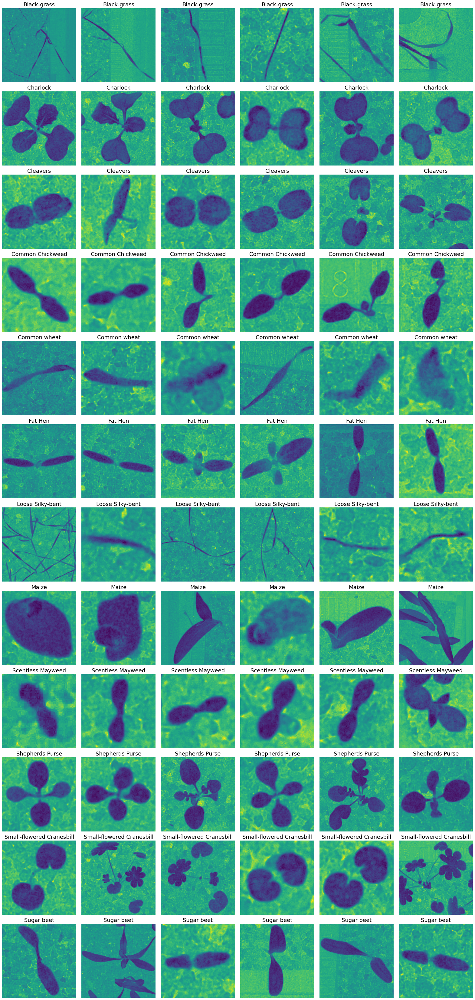

In [108]:
plot_images(img_type='lab')

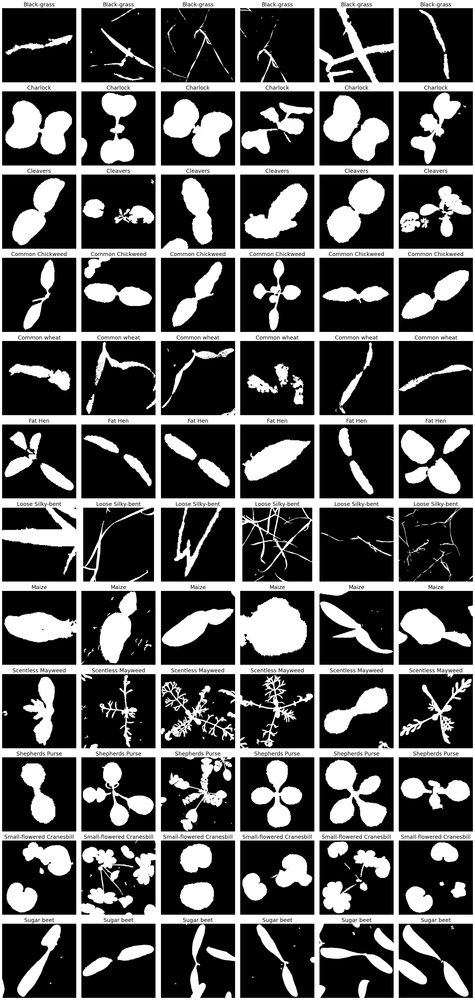

In [109]:
plot_images(img_type='binarize')

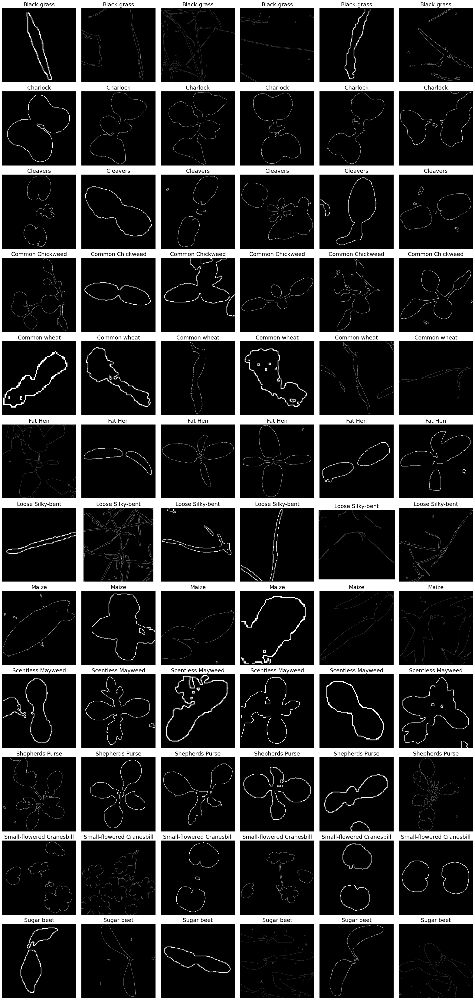

In [114]:
plot_images(img_type='edges')

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Finalizing the preprocessing on images</span></strong></li>
</ul></h4>

In [126]:
# kernel for dilation
kernel = np.array([[0.8]])
def multi_dilation(image, kernel, iterations):
    for i in range(iterations):
        image = dilation(image, kernel)
    return image

def preprocess(img, dilate=True, get_edges=True):
    img = pcv.rgb2gray_lab(img, 'a')
    img = pcv.threshold.binary(img, 120, 255, 'dark') # threshold
    img = pcv.fill(img, 85)  # fill noise, small objects    
    img = unsharp_mask(img, radius=2, amount=1)
    if dilate:
        img = multi_dilation(img, kernel, 1)
    if get_edges:
        edges = canny(img, sigma=0.9) # get edges using canny detector algorithm
        img = img + edges
    return img


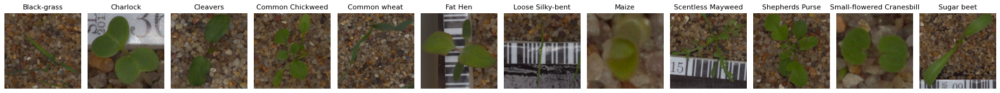

In [127]:
# get sample image from each speices
images = list()
for sp in species:
    # get random images for each species
    for i in range(1):
        images.append(random.choice(species[sp]))

# befre preprocessing
plot_images(num=1, fontsize=11, transpose=True, images=images)

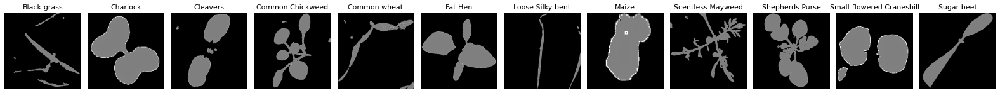

In [128]:
# after preprocessing
plot_images(num=1, fontsize=11, func=preprocess, transpose=True, images=images)

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>The models should be able to learn much better from the preprocessed images as all the noise is stripped out and teh shapes have become immediately apparent and distinct from each other
     </span></ul></h4>

100%|███████████████████████████████████████| 4767/4767 [03:36<00:00, 22.04it/s]


4766

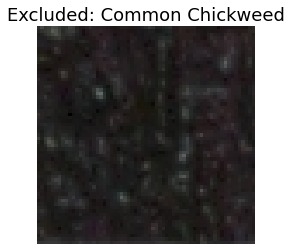

In [129]:
# preprocess all images
data_preprocessed = defaultdict(list)
for img, label in tqdm(zip(data['images'], data['labels']), total=len(data['labels']), ncols=80):
    try:
        img_preprocessed = preprocess(img)
        data_preprocessed['images'].append(img_preprocessed)
        data_preprocessed['labels'].append(label)
    except RuntimeError:
        # image excluded because it's dark and there's no information that can be learnt from it)
        plt.axis('off')
        plt.imshow(img)
        plt.title(f'Excluded: {label}', fontsize=18)
        plt.axis('off')
        
data_preprocessed = dict(data_preprocessed)

len(data_preprocessed['labels'])

In [130]:
heights = [img.shape[0] for img in data_preprocessed['images']]
widths = [img.shape[1] for img in data_preprocessed['images']]
heights[:5], widths[:5]

([196, 388, 886, 117, 471], [196, 388, 886, 117, 471])

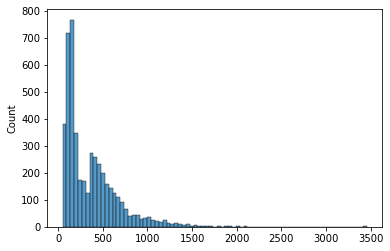

264.5

In [131]:
sns.histplot(heights)
plt.show()
np.median(heights)

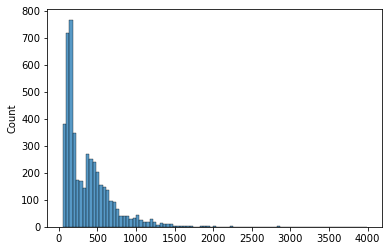

264.5

In [132]:
sns.histplot(widths)
plt.show()
np.median(widths)

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Resizing all images to 224x224x3
     </span></ul></h4>

In [149]:
# required for VGG
HEIGHT = 224
WIDTH = 224
DEPTH = 3
INPUT_SHAPE = (WIDTH, HEIGHT, DEPTH)

In [150]:
from skimage.transform import resize

def img_reshape(img, h=HEIGHT, w=WIDTH, c=DEPTH):
    # reshape images to hXw
    img = np.array(img)
    img = resize(img, (h, w, c), anti_aliasing=True)    
    return img

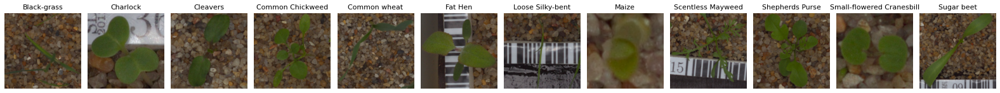

In [151]:
# Not much loss of quality of images

plot_images(num=1, fontsize=11, func=img_reshape, images=images, transpose=True)

In [152]:
# reshape all images
data_reshaped = defaultdict(list)
for img, label in tqdm(zip(data_preprocessed['images'], data_preprocessed['labels']),
                       total=len(data_preprocessed['labels']), ncols=80):
    img_reshaped = img_reshape(img)
    data_reshaped['images'].append(img_reshaped)
    data_reshaped['labels'].append(label)
data_reshaped = dict(data_reshaped)

len(data_reshaped['images'])

100%|███████████████████████████████████████| 4766/4766 [01:49<00:00, 43.48it/s]


4766

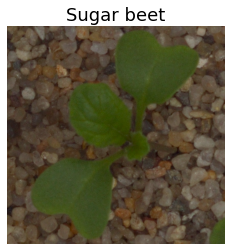

Shape: (418, 418, 3)


In [153]:
# original
img = data['images'][500]
display(img, label, fontsize=18)

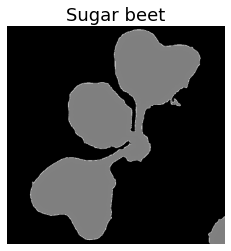

Shape: (418, 418)


In [154]:
# preprocessed
img = data_preprocessed['images'][500]
display(img, label, fontsize=18, cmap='gray')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


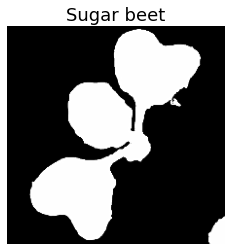

Shape: (224, 224, 3)


In [155]:
# final
img = data_reshaped['images'][500]
display(img, label, fontsize='gray', cmap='gray')

In [156]:
img.shape

(224, 224, 3)

In [157]:
# flatten all images
data_flattened = defaultdict(list)
for img, label in tqdm(zip(data_reshaped['images'], data_reshaped['labels']),
                       total=len(data_reshaped['labels']), ncols=80):
    img_flattened = img.flatten()
    data_flattened['images'].append(img_flattened)
    data_flattened['labels'].append(label)
data_flattened = dict(data_flattened)

len(data_flattened['images']), data_flattened['images'][0].shape

100%|█████████████████████████████████████| 4766/4766 [00:01<00:00, 3224.63it/s]


(4766, (150528,))

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Split the dataset into Train-Val-Test Cuts
     </span></ul></h4>

In [158]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

LABELS_CODES = {i: x for x, i in enumerate(SPECIES)}
pprint(LABELS_CODES, compact=True) # dict to convert labels to integers

{'Black-grass': 0,
 'Charlock': 1,
 'Cleavers': 2,
 'Common Chickweed': 3,
 'Common wheat': 4,
 'Fat Hen': 5,
 'Loose Silky-bent': 6,
 'Maize': 7,
 'Scentless Mayweed': 8,
 'Shepherds Purse': 9,
 'Small-flowered Cranesbill': 10,
 'Sugar beet': 11}


In [159]:
X = np.array(data_flattened['images'])

# all images are now flattened vectors of 250000X1
type(X[0]), X[0].shape

(numpy.ndarray, (150528,))

In [160]:
# one hot encoding for the labels vector
Y = to_categorical(np.array([LABELS_CODES[i] for i in data_flattened['labels']]))
type(Y[0]), Y[0],  Y[0].shape

(numpy.ndarray,
 array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32),
 (12,))

In [161]:
len(X), len(Y)

(4766, 4766)

In [162]:
X[0].flatten().shape

(150528,)

In [163]:
# 75% train - 12.5% validation - 12.5% test
X_train, X_temp, y_train, y_temp = train_test_split(X, Y, test_size=0.25, random_state=seed)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=seed)

len(X_train), len(X_val), len(X_test)

(3574, 596, 596)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Train Supervised Algorithms</span></strong></li>
</ul></h3>

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Multinomial Naive Bayes Classifier</span></strong></li>
</ul></h4>

In [164]:
from sklearn.naive_bayes import MultinomialNB

In [165]:
# svc only works with single dimenional lables
y_train_labels = [np.argmax(i) for i in y_train]
y_val_labels = [np.argmax(i) for i in y_val]
y_test_labels = [np.argmax(i) for i in y_test]
y_val_labels[:10]

[5, 7, 9, 6, 10, 6, 10, 5, 7, 0]

In [166]:
nb_model = MultinomialNB()
nb_model.fit(X_train, y_train_labels)

MultinomialNB()

In [167]:
def scores_(model):
    '''accuracies helper'''
    train_acc = model.score(X_train, y_train_labels)
    val_acc = model.score(X_val, y_val_labels)
    test_acc = model.score(X_test, y_test_labels)
    print(f'Train: {train_acc*100:.2f}%')
    print(f'Val:   {val_acc*100:.2f}%')
    print(f'Test:  {test_acc*100:.2f}%')


In [168]:
scores_(nb_model)

Train: 29.04%
Val:   24.50%
Test:  22.82%


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">SGD "Classifier</span></strong></li>
</ul></h4>

In [169]:
from sklearn.linear_model import SGDClassifier

In [170]:
sgd_model = SGDClassifier(random_state=seed, max_iter=50, tol=1e-3, n_jobs=-1)
sgd_model.fit(X_train, y_train_labels)

SGDClassifier(max_iter=50, n_jobs=-1, random_state=7)

In [171]:
scores_(sgd_model)

Train: 99.83%
Val:   30.87%
Test:  35.07%


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">KNN Classifier</span></strong></li>
</ul></h4>

In [172]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report

In [173]:
def scores(model):
    '''accuracies helper'''
    train_acc = model.score(X_train, y_train)
    val_acc = model.score(X_val, y_val)
    test_acc = model.score(X_test, y_test)
    print(f'Train: {train_acc*100:.2f}%')
    print(f'Val:   {val_acc*100:.2f}%')
    print(f'Test:  {test_acc*100:.2f}%')


In [174]:
# basic hyper parameter tuning to find num of neighbors
for k in [3, 4, 5, 6]:
    knn_model = KNeighborsClassifier(n_neighbors=k, n_jobs=-1)
    knn_model.fit(X_train, y_train)
    print("K: ", k)
    scores(knn_model)

K:  3
Train: 66.84%
Val:   43.12%
Test:  46.48%
K:  4
Train: 45.55%
Val:   33.22%
Test:  34.73%
K:  5
Train: 56.35%
Val:   41.11%
Test:  44.63%
K:  6
Train: 42.61%
Val:   32.38%
Test:  33.89%


In [175]:
K = 5 # best k based on validation accuracy

# simple KNN Classifier
knn_model = KNeighborsClassifier(n_neighbors=K, n_jobs=-1)
knn_model

KNeighborsClassifier(n_jobs=-1)

In [176]:
knn_model = KNeighborsClassifier(n_neighbors=K, n_jobs=-1)
knn_model.fit(X_train, y_train)

KNeighborsClassifier(n_jobs=-1)

In [177]:
scores(knn_model)

Train: 56.35%
Val:   41.11%
Test:  44.63%


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Neural Network</span></strong></li>
</ul></h3>

In [178]:
# !pip install livelossplot
from tensorflow.python.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Activation, BatchNormalization, Dropout
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.python.keras.callbacks import LambdaCallback, EarlyStopping

In [179]:
# To simplify the log
simple_log = LambdaCallback(
    on_epoch_end = lambda e, l: print(f" ~| Epoch: {e+1} | Validation Loss: {l['val_loss']:.5f} | Validation Acc: {l['val_accuracy']:.5f}", end =" >|> \n" ))

early_stop = EarlyStopping(monitor='val_loss',
                           min_delta=0,
                           patience=5,
                           verbose=1, 
                           restore_best_weights=True)


# helpers to plot and show metrics
def plot_learning_curve(hist, metric='accuracy'):
    sns.set()
    plt.figure(figsize=(5, 4))
    train = hist.history[metric]
    val = hist.history[f'val_{metric}']
    epochs_run = range(1,len(train) + 1)
    sns.lineplot(epochs_run, train, marker = 'o', color = 'coral', label = 'Training')
    sns.lineplot(epochs_run, val,  marker = '>', color = 'green', label = 'Validation')
    plt.title(f"{metric.capitalize()} vs. Epochs", fontsize = 20)
    plt.legend()
    plt.show()
    
def plot_confusion(model):
    sns.set()
    fig = plt.figure(figsize = (10, 10))
    y_pred_bn = model.predict(X_test)

    y_pred_bn = np.argmax(y_pred_bn, 1)
    y_test_bn = np.argmax(y_test, 1)

    conf = confusion_matrix(y_test_bn, y_pred_bn)

    ax = sns.heatmap(conf.T, annot=True, fmt='.0f', cmap=sns.color_palette("rocket", as_cmap = True))
    ax.set_xticklabels(SPECIES)
    ax.set_yticklabels(SPECIES)
    rotx = ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    roty = ax.set_yticklabels(ax.get_yticklabels(), rotation=30)
    plt.xlabel('Predicted Values')
    plt.ylabel('True Values')
    plt.show()

def scores_nn(model):
    y_pred_tr = model.predict(X_train)
    y_pred_tr = np.argmax(y_pred_tr, 1)
    y_test_tr = np.argmax(y_train, 1)
    
    y_pred_te = model.predict(X_test)
    y_pred_te = np.argmax(y_pred_te, 1)
    y_test_te = np.argmax(y_test, 1)

    print(f"Train: {accuracy_score(y_test_tr, y_pred_tr)*100:.2f}%")
    print(f"Test:  {accuracy_score(y_test_te, y_pred_te)*100:.2f}%")

In [182]:
# reshape to correct shape for keras: [number of examples, height, width, channel] 
dataset = np.array([np.array(i) for i in data_reshaped['images']])
dataset = dataset.reshape(dataset.shape[0], dataset.shape[1], dataset.shape[2], dataset.shape[3])
dataset.shape

(4766, 224, 224, 3)

In [185]:
X_train, X_test, y_train, y_test = train_test_split(dataset, Y, test_size=0.2, random_state=seed)
len(X_train), len(X_test)

(3812, 954)

In [186]:
len(y_train), len(y_test)

(3812, 954)

In [187]:
X_train.shape

(3812, 224, 224, 3)

In [188]:
y_train.shape

(3812, 12)

In [189]:
nn_model = Sequential([
    Flatten(),
    Dense(500,  kernel_initializer='he_normal', activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(500, kernel_initializer='he_normal', activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(500, kernel_initializer='he_normal', activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(200, kernel_initializer='he_normal', activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(200, kernel_initializer='he_normal', activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(len(SPECIES), activation='softmax')
    ])

In [190]:
nn_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [191]:
epochs = 300
batch_size = 16
with tf.device("gpu:0"):
    h1 = nn_model.fit(X_train, y_train,
                  epochs=epochs,
                  batch_size=batch_size,
                  validation_split=0.2, 
                  callbacks = [early_stop, simple_log],
                  verbose = False)

 ~| Epoch: 1 | Validation Loss: 2.18115 | Validation Acc: 0.34993 >|> 
 ~| Epoch: 2 | Validation Loss: 1.45949 | Validation Acc: 0.49017 >|> 
 ~| Epoch: 3 | Validation Loss: 1.34644 | Validation Acc: 0.53080 >|> 
 ~| Epoch: 4 | Validation Loss: 1.37858 | Validation Acc: 0.50066 >|> 
 ~| Epoch: 5 | Validation Loss: 1.28886 | Validation Acc: 0.53211 >|> 
 ~| Epoch: 6 | Validation Loss: 1.22389 | Validation Acc: 0.55832 >|> 
 ~| Epoch: 7 | Validation Loss: 1.24486 | Validation Acc: 0.55177 >|> 
 ~| Epoch: 8 | Validation Loss: 1.24598 | Validation Acc: 0.55963 >|> 
 ~| Epoch: 9 | Validation Loss: 1.35383 | Validation Acc: 0.50721 >|> 
 ~| Epoch: 10 | Validation Loss: 1.29203 | Validation Acc: 0.54522 >|> 
Restoring model weights from the end of the best epoch.
 ~| Epoch: 11 | Validation Loss: 1.24936 | Validation Acc: 0.56881 >|> 
Epoch 00011: early stopping


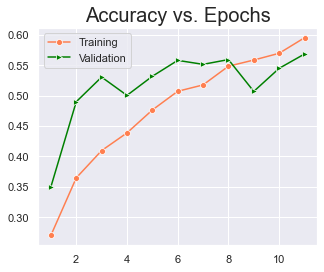

In [192]:
plot_learning_curve(h1, metric='accuracy')

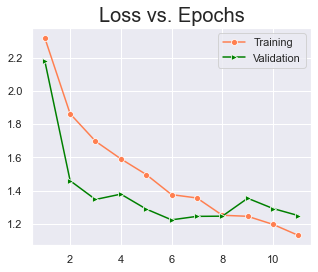

In [193]:
plot_learning_curve(h1, metric='loss')

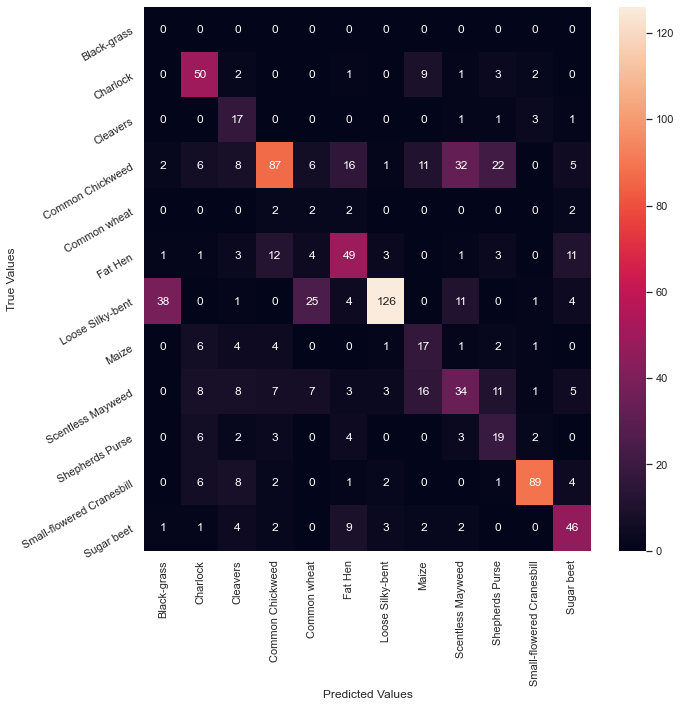

In [194]:
plot_confusion(nn_model)

In [195]:
scores_nn(nn_model)

Train: 64.72%
Test:  56.18%


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Convolutional Neural Network</span></strong></li>
</ul></h3>

In [196]:
from tensorflow.keras.layers import MaxPooling2D, MaxPool2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Conv2D
from keras.callbacks import  ReduceLROnPlateau

In [197]:
dataset.shape

(4766, 224, 224, 3)

In [198]:
X_train, X_test, y_train, y_test = train_test_split(dataset, Y, test_size=0.2, random_state=seed, stratify=Y)
len(X_train), len(X_test)

(3812, 954)

In [199]:
len(y_train), len(y_test)

(3812, 954)

In [200]:
y_train.shape

(3812, 12)

In [202]:
cnn_model = Sequential([    
    Conv2D(filters=64, kernel_size=(5, 5), input_shape=INPUT_SHAPE, activation='relu'),
    BatchNormalization(axis=3),
    Conv2D(filters=64, kernel_size=(5, 5), activation='relu'),
    MaxPooling2D((2, 2)),
    BatchNormalization(axis=3),
    Dropout(0.1),

    Conv2D(filters=128, kernel_size=(5, 5), activation='relu'),
    BatchNormalization(axis=3),
    Conv2D(filters=128, kernel_size=(5, 5), activation='relu'),
    MaxPooling2D((2, 2)),
    BatchNormalization(axis=3),
    Dropout(0.1),

    Conv2D(filters=256, kernel_size=(5, 5), activation='relu'),
    BatchNormalization(axis=3),
    Conv2D(filters=256, kernel_size=(5, 5), activation='relu'),
    MaxPooling2D((2, 2)),
    BatchNormalization(axis=3),
    Dropout(0.1),

    Flatten(),

    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),

    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),

    Dense(len(SPECIES), activation='softmax')
    
])


In [203]:
cnn_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 220, 220, 64)      4864      
_________________________________________________________________
batch_normalization_5 (Batch (None, 220, 220, 64)      256       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 216, 216, 64)      102464    
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 108, 108, 64)      0         
_________________________________________________________________
batch_normalization_6 (Batch (None, 108, 108, 64)      256       
_________________________________________________________________
dropout_5 (Dropout)          (None, 108, 108, 64)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 104, 104, 128)    

In [204]:
epochs = 200
batch_size = 16
early_stop = EarlyStopping(monitor='val_accuracy',
                           min_delta=0,
                           patience=15,
                           verbose=1, 
                           restore_best_weights=True)

# learning rate reduction
lr_reduce_on_plateau = ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.4, 
                                            min_lr=0.00001)

cnn_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
with tf.device("gpu:0"):
    h2 = cnn_model.fit(X_train, y_train,
                  epochs=epochs,
                  batch_size=batch_size,
                  validation_split=0.2, 
                  callbacks = [early_stop, simple_log, lr_reduce_on_plateau],
                  verbose = False)

 ~| Epoch: 1 | Validation Loss: 9.50541 | Validation Acc: 0.07995 >|> 
 ~| Epoch: 2 | Validation Loss: 4.75579 | Validation Acc: 0.15727 >|> 
 ~| Epoch: 3 | Validation Loss: 1.08199 | Validation Acc: 0.63434 >|> 
 ~| Epoch: 4 | Validation Loss: 7.53313 | Validation Acc: 0.25295 >|> 
 ~| Epoch: 5 | Validation Loss: 1.20243 | Validation Acc: 0.60157 >|> 
 ~| Epoch: 6 | Validation Loss: 0.96787 | Validation Acc: 0.68152 >|> 
 ~| Epoch: 7 | Validation Loss: 0.86960 | Validation Acc: 0.70904 >|> 
 ~| Epoch: 8 | Validation Loss: 1.96348 | Validation Acc: 0.49148 >|> 
 ~| Epoch: 9 | Validation Loss: 1.69234 | Validation Acc: 0.49410 >|> 
 ~| Epoch: 10 | Validation Loss: 1.80750 | Validation Acc: 0.51507 >|> 

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 11 | Validation Loss: 0.85098 | Validation Acc: 0.72739 >|> 
 ~| Epoch: 12 | Validation Loss: 0.87922 | Validation Acc: 0.69463 >|> 
 ~| Epoch: 13 | Validation Loss: 1.95153 | Validation Acc: 0.495

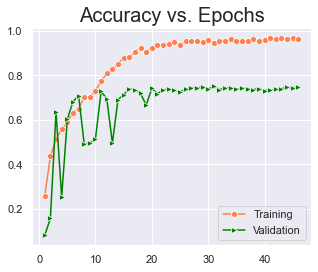

In [205]:
plot_learning_curve(h2, metric='accuracy')

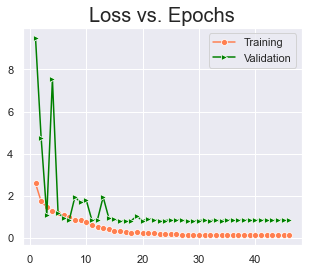

In [206]:
plot_learning_curve(h2, metric='loss')

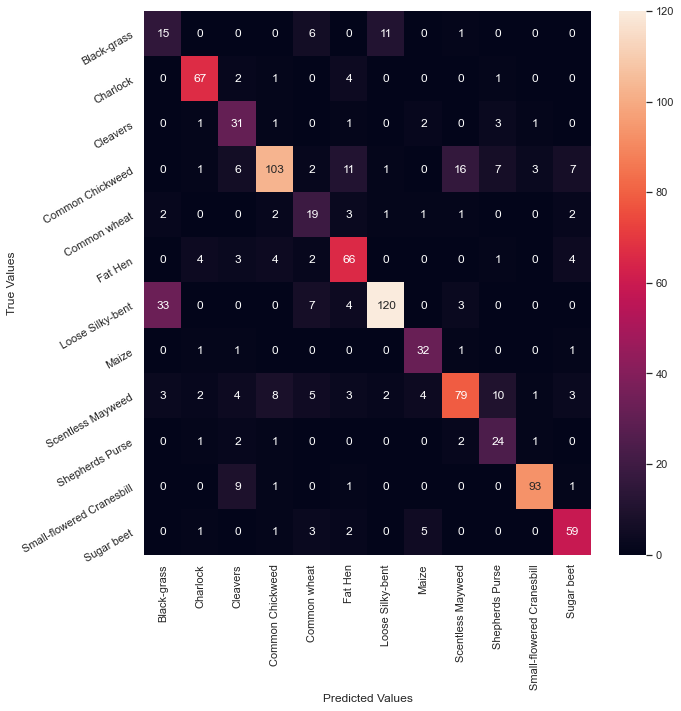

In [207]:
plot_confusion(cnn_model)

In [208]:
scores_nn(cnn_model)

Train: 94.88%
Test:  74.21%


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use Data Augmentation</span></strong></li>
</ul></h3>

In [209]:
# 75% train - 12.5% validation - 12.5% test
X_train, X_temp, y_train, y_temp = train_test_split(dataset, Y, test_size=0.2, random_state=seed, stratify=Y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=seed)

len(X_train), len(X_val), len(X_test)

(3812, 477, 477)

In [210]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

tr_datagen = ImageDataGenerator(
        rotation_range=180,  # randomly rotate images in the range
        zoom_range = 0.1, # Randomly zoom image 
        width_shift_range=0.1,  # randomly shift images horizontally
        height_shift_range=0.1,  # randomly shift images vertically 
        horizontal_flip=True,  # randomly flip images horizontally
        vertical_flip=True  # randomly flip images vertically
    )  

# create new generator for validation
val_datagen = ImageDataGenerator()    # don't perform augmentation on validation data

# compute quantities required for featurewise normalization
tr_datagen.fit(X_train)
val_datagen.fit(X_val)

In [211]:
cnn_model2 = Sequential([    
    Conv2D(filters=64, kernel_size=(5, 5), input_shape=INPUT_SHAPE, activation='relu'),
    BatchNormalization(axis=3),
    Conv2D(filters=64, kernel_size=(5, 5), activation='relu'),
    MaxPooling2D((2, 2)),
    BatchNormalization(axis=3),
    Dropout(0.1),

    Conv2D(filters=128, kernel_size=(5, 5), activation='relu'),
    BatchNormalization(axis=3),
    Conv2D(filters=128, kernel_size=(5, 5), activation='relu'),
    MaxPooling2D((2, 2)),
    BatchNormalization(axis=3),
    Dropout(0.1),

    Conv2D(filters=256, kernel_size=(5, 5), activation='relu'),
    BatchNormalization(axis=3),
    Conv2D(filters=256, kernel_size=(5, 5), activation='relu'),
    MaxPooling2D((2, 2)),
    BatchNormalization(axis=3),
    Dropout(0.1),

    Flatten(),

    Dense(512, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),

    Dense(512, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),

    Dense(len(SPECIES), activation='softmax')
    
])


In [212]:
from tensorflow.python.keras.callbacks import LambdaCallback, EarlyStopping

epochs = 200
batch_size = 16
cnn_model2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

with tf.device("gpu:0"):
    h3 = cnn_model2.fit(tr_datagen.flow(X_train, y_train,
                                        batch_size=batch_size, 
                                        seed=seed,
                                        shuffle=False),
                        epochs=epochs,
                        steps_per_epoch=X_train.shape[0] // batch_size,
                        validation_data=(X_val, y_val),
                        callbacks = [early_stop, simple_log, lr_reduce_on_plateau],
                        verbose=False)

 ~| Epoch: 1 | Validation Loss: 3.42344 | Validation Acc: 0.29979 >|> 
 ~| Epoch: 2 | Validation Loss: 3.04243 | Validation Acc: 0.22851 >|> 
 ~| Epoch: 3 | Validation Loss: 6.41107 | Validation Acc: 0.14256 >|> 
 ~| Epoch: 4 | Validation Loss: 8.70275 | Validation Acc: 0.21174 >|> 

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 5 | Validation Loss: 1.35081 | Validation Acc: 0.53040 >|> 
 ~| Epoch: 6 | Validation Loss: 1.12158 | Validation Acc: 0.62893 >|> 
 ~| Epoch: 7 | Validation Loss: 1.44112 | Validation Acc: 0.54717 >|> 
 ~| Epoch: 8 | Validation Loss: 2.00581 | Validation Acc: 0.42558 >|> 
 ~| Epoch: 9 | Validation Loss: 2.55755 | Validation Acc: 0.38574 >|> 

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.00016000000759959222.
 ~| Epoch: 10 | Validation Loss: 0.81855 | Validation Acc: 0.72117 >|> 
 ~| Epoch: 11 | Validation Loss: 0.93960 | Validation Acc: 0.66667 >|> 
 ~| Epoch: 12 | Validation Loss: 0.90587 | Validation 

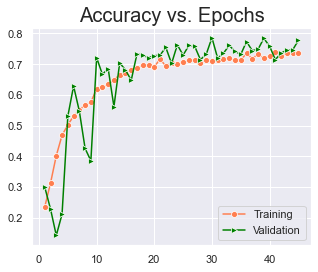

In [213]:
plot_learning_curve(h3, metric='accuracy')

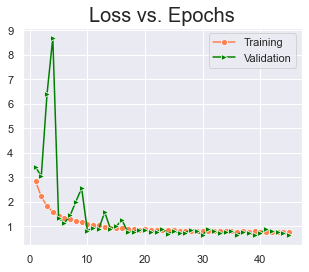

In [214]:
plot_learning_curve(h3, metric='loss')

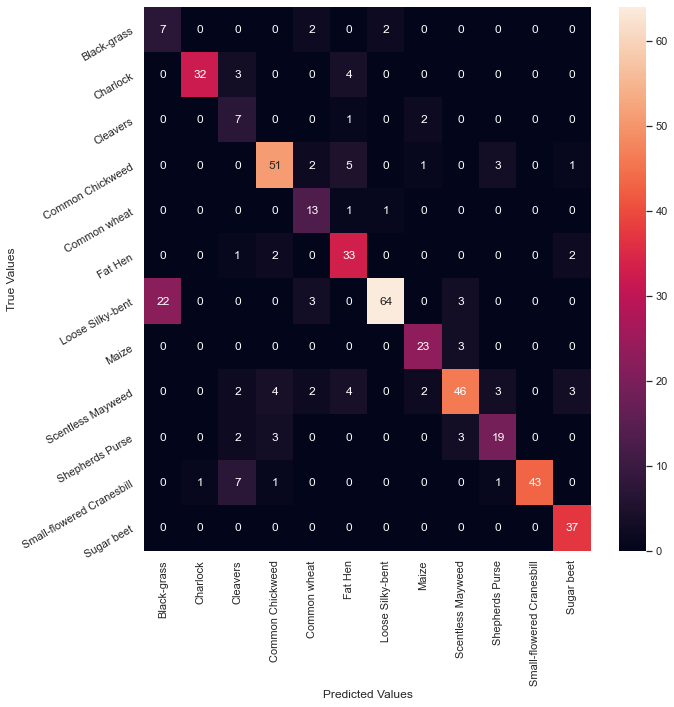

In [215]:
plot_confusion(cnn_model2)

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">We can see that the model was able to predict most species correctly but makes most mistakes on Black-grass and Loose Silky-bent. This might be because both are actually types of grass and the model is unable to disambaguate the patterns for these. Some more data collection/augmentation for these classes or using additional features or a separate model for these might help boost the final accuracy further.</span></strong></li>
</ul></h4>

In [216]:
scores_nn(cnn_model2)

Train: 77.86%
Test:  78.62%


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Transfer Learning</span></strong></li>
</ul></h3>

In [286]:
from keras.applications.vgg16 import VGG16

vgg_model = VGG16(include_top=False, weights='imagenet', input_shape=INPUT_SHAPE)
vgg_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [287]:
from tensorflow.keras.models import Model


FINETUNE = True
if FINETUNE == True:
    for layer in vgg_model.layers:
        layer.trainable = False

    output = Flatten()(vgg_model.output)
    vgg_flatten = Model(vgg_model.input, output)

    finetune_model = Sequential()
    # add vgg, flatten layer
    finetune_model.add(vgg_flatten)

    # fully connected layers
    for i in range(2):
        finetune_model.add(Dense(1024, activation='relu'))
        finetune_model.add(BatchNormalization())
        finetune_model.add(Dropout(0.5))

    for i in range(2):
        finetune_model.add(Dense(512, activation='relu'))
        finetune_model.add(BatchNormalization())
        finetune_model.add(Dropout(0.5))
    # softmax output for multiclass prediction
    finetune_model.add(Dense(len(SPECIES), activation='softmax'))
else:
    # add vgg, flatten layer
    vgg_flatten = Flatten()(vgg_model.output)

    # softmax output for multiclass prediction
    prediction=Dense(len(SPECIES), activation='softmax')(flatten)
    finetune_model= Model(inputs=vgg_model.input, outputs=prediction)

In [288]:
finetune_model.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
model_9 (Functional)         (None, 25088)             14714688  
_________________________________________________________________
dense_34 (Dense)             (None, 1024)              25691136  
_________________________________________________________________
batch_normalization_25 (Batc (None, 1024)              4096      
_________________________________________________________________
dropout_29 (Dropout)         (None, 1024)              0         
_________________________________________________________________
dense_35 (Dense)             (None, 1024)              1049600   
_________________________________________________________________
batch_normalization_26 (Batc (None, 1024)              4096      
_________________________________________________________________
dropout_30 (Dropout)         (None, 1024)             

In [290]:
epochs = 200
batch_size = 32
finetune_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

with tf.device("gpu:0"):
    h4 = finetune_model.fit(tr_datagen.flow(X_train, y_train,
                                        batch_size=batch_size, 
                                        seed=seed,
                                        shuffle=False),
                        epochs=epochs,
                        steps_per_epoch=X_train.shape[0] // batch_size,
                        validation_data=(X_val, y_val),
                        callbacks = [early_stop, simple_log, lr_reduce_on_plateau],
                        verbose=False)


 ~| Epoch: 1 | Validation Loss: 1.52901 | Validation Acc: 0.67925 >|> 
 ~| Epoch: 2 | Validation Loss: 0.77217 | Validation Acc: 0.78407 >|> 
 ~| Epoch: 3 | Validation Loss: 0.72385 | Validation Acc: 0.77568 >|> 
 ~| Epoch: 4 | Validation Loss: 0.51088 | Validation Acc: 0.83019 >|> 
 ~| Epoch: 5 | Validation Loss: 0.51463 | Validation Acc: 0.83229 >|> 
 ~| Epoch: 6 | Validation Loss: 0.45237 | Validation Acc: 0.85744 >|> 
 ~| Epoch: 7 | Validation Loss: 0.46957 | Validation Acc: 0.85325 >|> 
 ~| Epoch: 8 | Validation Loss: 0.43603 | Validation Acc: 0.84906 >|> 
 ~| Epoch: 9 | Validation Loss: 0.39352 | Validation Acc: 0.86792 >|> 
 ~| Epoch: 10 | Validation Loss: 0.39046 | Validation Acc: 0.87002 >|> 
 ~| Epoch: 11 | Validation Loss: 0.47437 | Validation Acc: 0.83857 >|> 
 ~| Epoch: 12 | Validation Loss: 0.37993 | Validation Acc: 0.87002 >|> 
 ~| Epoch: 13 | Validation Loss: 0.39129 | Validation Acc: 0.85954 >|> 

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0004000000189

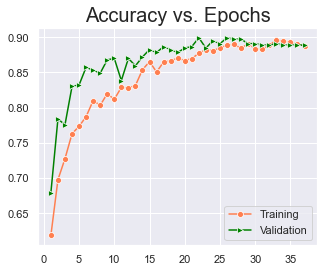

In [291]:
plot_learning_curve(h4, metric='accuracy')

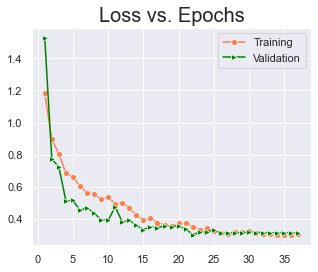

In [292]:
plot_learning_curve(h4, metric='loss')

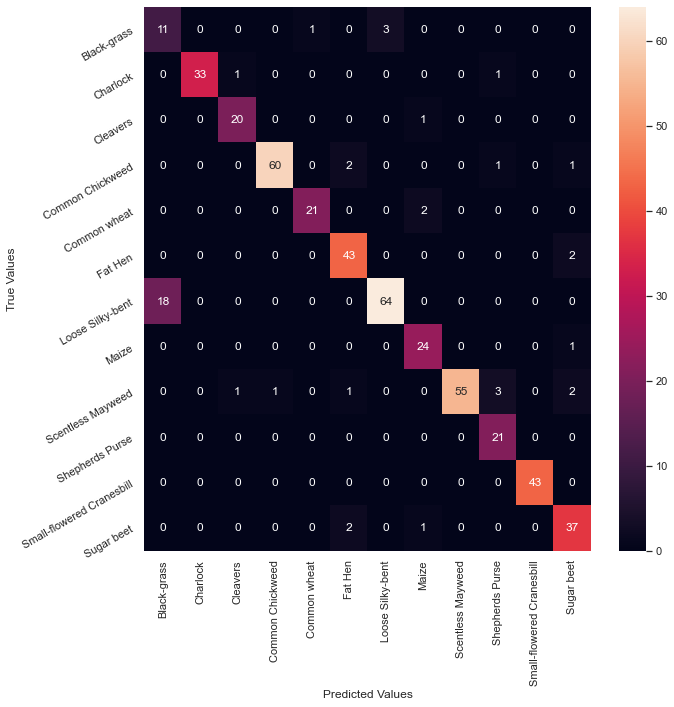

In [293]:
plot_confusion(finetune_model)

In [294]:
scores_nn(finetune_model)

Train: 93.28%
Test:  90.57%


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Pickle the best model for future use</span></strong></li>
</ul></h3>

In [295]:
best_model = finetune_model
filename = 'Seedling_Species_Classifier'
best_model.save(f"{filename}.h5")

In [296]:
# some time later...

# load the model from disk
from tensorflow.keras.models import load_model
 
# load model
seedling_classifier = load_model(f"{filename}.h5")
# summarize model.
seedling_classifier.summary()
# Hence, this model can be loaded and re-used anywhere with similar datasets

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
model_9 (Functional)         (None, 25088)             14714688  
_________________________________________________________________
dense_34 (Dense)             (None, 1024)              25691136  
_________________________________________________________________
batch_normalization_25 (Batc (None, 1024)              4096      
_________________________________________________________________
dropout_29 (Dropout)         (None, 1024)              0         
_________________________________________________________________
dense_35 (Dense)             (None, 1024)              1049600   
_________________________________________________________________
batch_normalization_26 (Batc (None, 1024)              4096      
_________________________________________________________________
dropout_30 (Dropout)         (None, 1024)             

In [297]:
img_path = Path('./data/Seedling - Prediction/Predict.png')
test_img = imread(img_path)

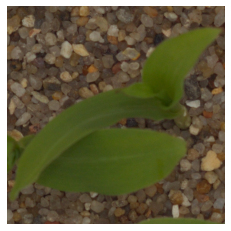

Shape: (578, 578, 3)


In [298]:
display(test_img, label='')

In [299]:
CODES_LABELS = {v: i for i, v in LABELS_CODES.items()}

In [300]:
CODES_LABELS

{0: 'Black-grass',
 1: 'Charlock',
 2: 'Cleavers',
 3: 'Common Chickweed',
 4: 'Common wheat',
 5: 'Fat Hen',
 6: 'Loose Silky-bent',
 7: 'Maize',
 8: 'Scentless Mayweed',
 9: 'Shepherds Purse',
 10: 'Small-flowered Cranesbill',
 11: 'Sugar beet'}

In [305]:
# predict
def predict_seedling(image, model=seedling_classifier, labels=CODES_LABELS, actual=''):
    display(image, label='Input')
    # preprocess
    image_preprocessed = preprocess(image)
    # reshape to 256x256
    image_reshaped = img_reshape(image_preprocessed)
    display(image_reshaped, label='Reshaped')
    # reshape the input tensor to 1x256z256x1 to make it compatible with mdoel format
    model_input = image_reshaped.reshape(
        [1, image_reshaped.shape[0], image_reshaped.shape[1], 3])
    # predict 
    softamx_output = seedling_classifier(model_input)
    # convert to hardmax using np.argmax
    code = np.argmax(softamx_output)
    # get label
    pred_label = labels.get(code)
    # display final prediction
    if actual:
        display(image, label=f'Predicted: {pred_label} | Actual: {actual}')
    else:
        display(image, label=f'Predicted: {pred_label}')

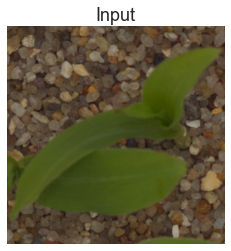

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape: (578, 578, 3)


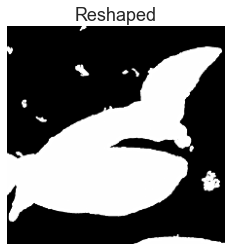

Shape: (224, 224, 3)


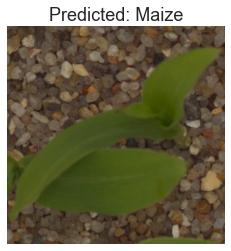

Shape: (578, 578, 3)


In [306]:
predict_seedling(test_img)

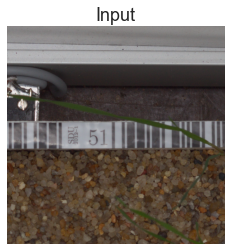

Shape: (1009, 1009, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


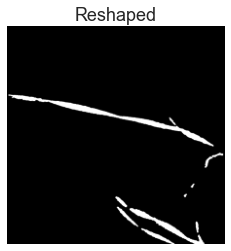

Shape: (224, 224, 3)


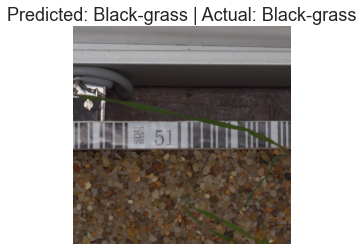

Shape: (1009, 1009, 3)


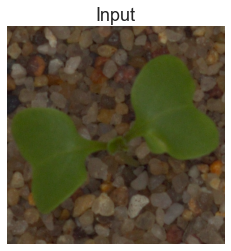

Shape: (385, 385, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


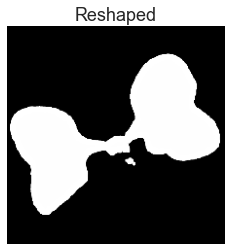

Shape: (224, 224, 3)


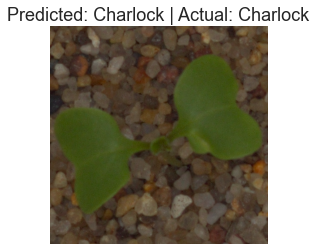

Shape: (385, 385, 3)


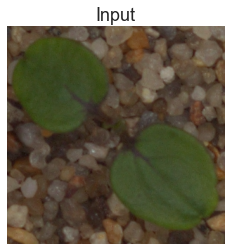

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape: (310, 310, 3)


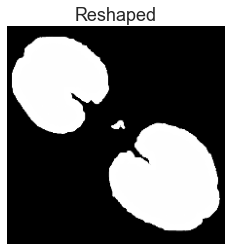

Shape: (224, 224, 3)


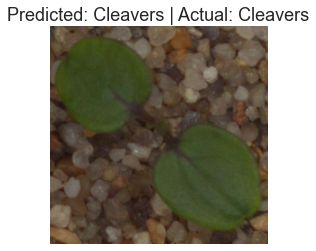

Shape: (310, 310, 3)


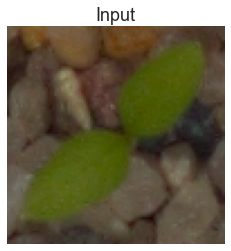

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape: (97, 97, 3)


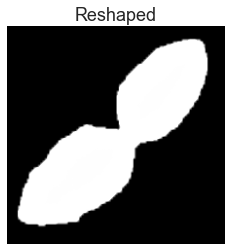

Shape: (224, 224, 3)


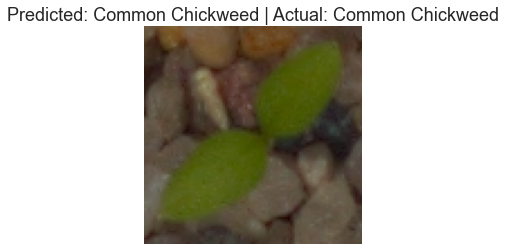

Shape: (97, 97, 3)


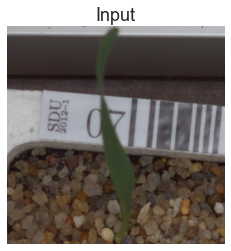

Shape: (540, 540, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


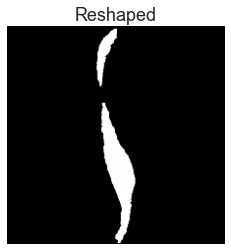

Shape: (224, 224, 3)


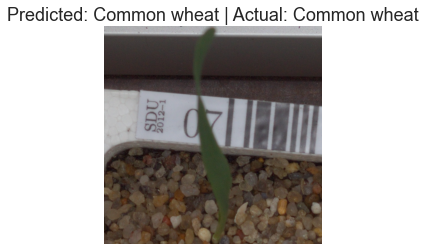

Shape: (540, 540, 3)


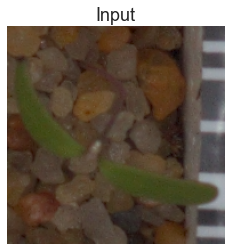

Shape: (191, 191, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


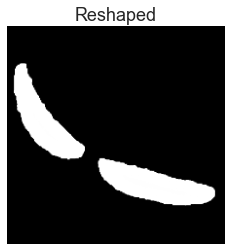

Shape: (224, 224, 3)


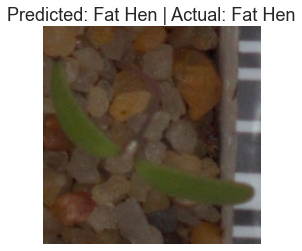

Shape: (191, 191, 3)


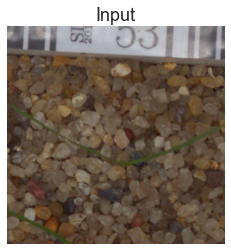

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape: (461, 461, 3)


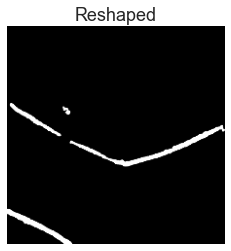

Shape: (224, 224, 3)


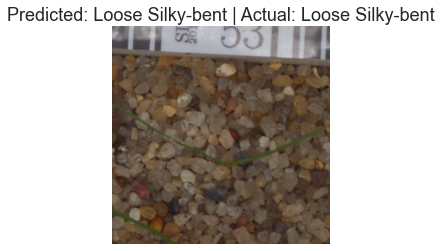

Shape: (461, 461, 3)


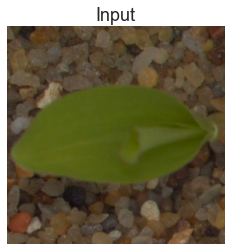

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape: (365, 365, 3)


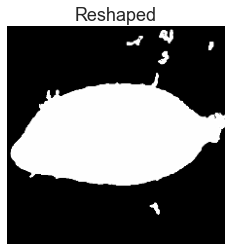

Shape: (224, 224, 3)


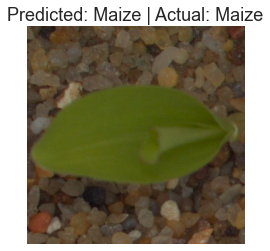

Shape: (365, 365, 3)


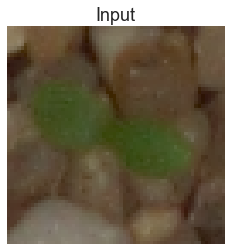

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape: (64, 64, 3)


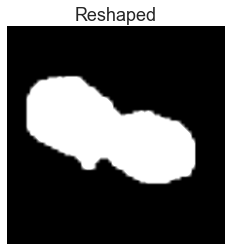

Shape: (224, 224, 3)


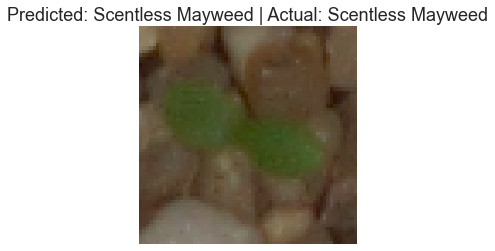

Shape: (64, 64, 3)


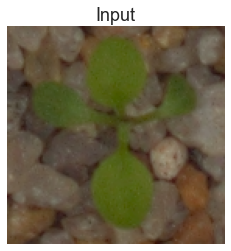

Shape: (140, 140, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


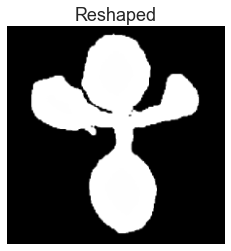

Shape: (224, 224, 3)


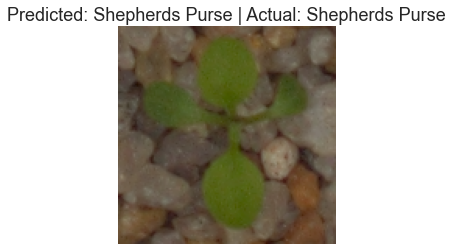

Shape: (140, 140, 3)


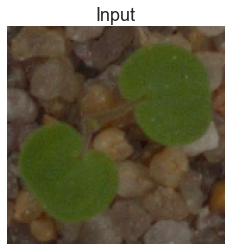

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape: (156, 156, 3)


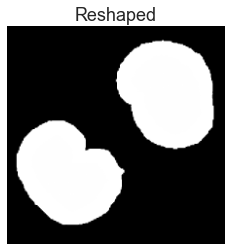

Shape: (224, 224, 3)


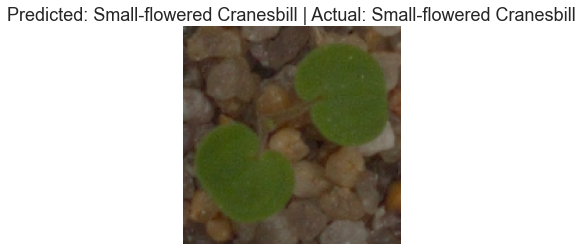

Shape: (156, 156, 3)


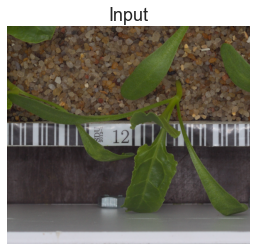

Shape: (1174, 1310, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


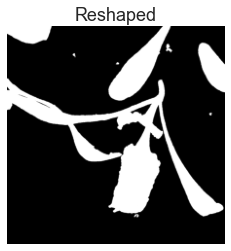

Shape: (224, 224, 3)


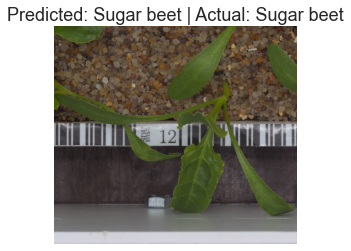

Shape: (1174, 1310, 3)


In [307]:
# test on a few random sample images from each species
images = list()
labels = list()
for sp in species:
    # get random images for each species
    for i in range(1):
        images.append(random.choice(species[sp]))
        labels.append(sp)

for test_img, label in zip(images, labels):
    predict_seedling(test_img, actual=label)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">GUI to load the model and Classify Images</span></strong></li>
</ul></h3>

In [ ]:
# load model to use for the GUI

# load the model from disk
from tensorflow.keras.models import load_model
 
filename = 'Seedling_Species_Classifier'
# load model
seedling_classifier = load_model(f"{filename}.h5")
# summarize model.
seedling_classifier.summary()
# Hence, this model can be loaded and re-used anywhere with similar datasets

In [369]:
import tkinter as tk
from tkinter.filedialog import askopenfilename
import matplotlib
matplotlib.use('TkAgg')
from matplotlib.figure import Figure
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg


def load_image():
    """Code to import csv data"""
    global v, img_check, image
    img_path = askopenfilename()
    img_path = Path(img_path)
    print('Loading image from: ', img_path)
    v.set(img_path)
    try:
        img_check.set("")
        image = imread(img_path)
        print("Loaded image of shape: ", image.shape)
        img_check.set("Done!")
    except img_check as e:
        print(e)
        img_check.set("Not a valid Image!")

# predict
def predict_seedling_(model=seedling_classifier, labels=CODES_LABELS, actual=''):
    global target, image, prediction
    # preprocess
    image_preprocessed = preprocess(image)
    # reshape to 256x256
    image_reshaped = img_reshape(image_preprocessed)
    # reshape the input tensor to 1x256z256x1 to make it compatible with mdoel format
    model_input = image_reshaped.reshape(
        [1, image_reshaped.shape[0], image_reshaped.shape[1], 3])
    # predict 
    softamx_output = seedling_classifier(model_input)
    # convert to hardmax using np.argmax
    code = np.argmax(softamx_output)
    target.set('Done!')
    # get label
    pred_label = labels.get(code)
    pred_label = f'Prediction: {pred_label}'
    prediction.set(pred_label)
    # display final prediction
    display(image, label=pred_label)
    
    fig = Figure(figsize=(6,6))
    plt.imshow(image)
    plt.title(f'{pred_label}', fontsize=18)
    plt.axis('off')
    try:
        canvas = FigureCanvasTkAgg(fig, master=root)
        canvas.get_tk_widget().pack()
        canvas.draw()
    except Exception as _:
        pass

In [370]:

# Load Image
root = tk.Tk()
root.title('Seedling Species Classifier')
tk.Label(root, text='File Name: ').grid(row=5, column=0)
v = tk.StringVar()
img_check = tk.StringVar()
entry = tk.Entry(root, textvariable=v).grid(row=5, column=1)
tk.Button(root, text='Import Image',command=load_image).grid(row=5, column=2)
entry2 = tk.Entry(root, textvariable=img_check).grid(row=5, column=3)


# Predict
tk.Label(root, text='Classify').grid(row=7, column=0)
target = tk.StringVar()
prediction = tk.StringVar()
userentry = tk.Entry(root, textvariable=target).grid(row=7, column=1)
tk.Button(root, text='predict',command=predict_seedling_).grid(row=7, column=2)
found_or_not = tk.Entry(root, textvariable=prediction).grid(row=7, column=3)

root.mainloop() 

Loading image from:  C:\Users\surya\dev\repos\UTAustin-IITB-PG-AIML\Computer Vision\Computer Vision\data\Predict.png
Loaded image of shape:  (578, 578, 3)
Shape: (578, 578, 3)
cannot use geometry manager pack inside . which already has slaves managed by grid
